# Кто выбирает президентов
# Часть 3: Визуализация данных

Итак, мы собрали датасеты по подписчикам наших кандидатов - немного социально-демографических признаков и записи со стен. Посмотрим, что можно визуализировать по таким данным.

In [1]:
import pandas as pd              # Пакет для работы с таблицами
import numpy as np               # Пакет для работы с векторами и матрицами
import matplotlib.pyplot as plt  # Пакет для строительства графиков
import seaborn as sns            # Еще один пакет для графиков
import datetime                  # Пакет для работы с временными форматами
import pickle                    # Пакет для подгрузки данных специфического для питона формата

from dateutil.relativedelta import relativedelta # еще один пакет для работы с временем
from wordcloud import WordCloud  # Пакет для построения облаков слов

plt.style.use('ggplot')          # задаём красивый стиль для графиков matplotlib-а
%matplotlib inline

# Облака

In [4]:
# подгружаем файл чанками, чтобы не падало ядро из-за перегрузки оперативной памяти
for chunck_df in pd.read_csv('data_text_lemm.csv', sep=';', index_col=0, chunksize=1000):
    lemmatized_posts = lemmatized_posts.append(chunck_df, ignore_index=True)

In [5]:
lemmatized_posts.shape

(71544, 2)

In [6]:
lemmatized_posts.head()

,candidat_name,lemm_text
0,Putin,"['друг', 'встречаться', 'сегодня', '19', '00',..."
1,Putin,"['это', 'вещь', 'собрать', 'осадный', 'мортира..."
2,Putin,"['конкурс', '15', 'рандомный', 'ключ', 'steam'..."
3,Putin,"['сметь', 'думать', 'мочь', 'выдержать', 'эрне..."
4,Putin,"['художник', 'ринат', 'волигамси', 'большой', ..."


In [17]:
def getFullText(candidate):
    """
        Возвращает строку, содержащую склеенные посты по данному кандидату
    """

    cloud = ''
    for i in lemmatized_posts[lemmatized_posts.candidat_name==candidate].lemm_text:
        posts = i[1:-1].split()
        posts = [word for word in posts if len(word)>5]
        cloud += (' '+" ".join(posts))
        
    return cloud

In [18]:
cloud_putin = getFullText('Putin')

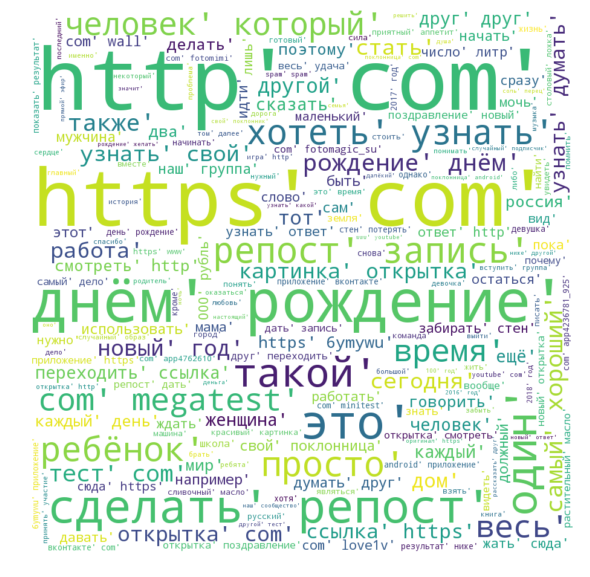

In [20]:
wordcloud = WordCloud(background_color="white", max_words=200, width=900, height=900)
wordcloud = wordcloud.generate(cloud_putin)
plt.figure(figsize=(15, 10))
plt.imshow(wordcloud, interpolation='bilinear',)
plt.axis("off");

# Топики

Визуализируем все 30 топиков, построенных по всему корпусу текста

In [55]:
with open('lda_models/lda_30_topics_bigrams', 'rb') as f:
    lda_20_topics = pickle.load(f)

In [56]:
wordcloud = WordCloud(background_color="white", max_words=100,
                      width=900, height=900, collocations=False)

wordcloud = wordcloud.generate_from_frequencies(dict(lda_20_topics[0][1]))

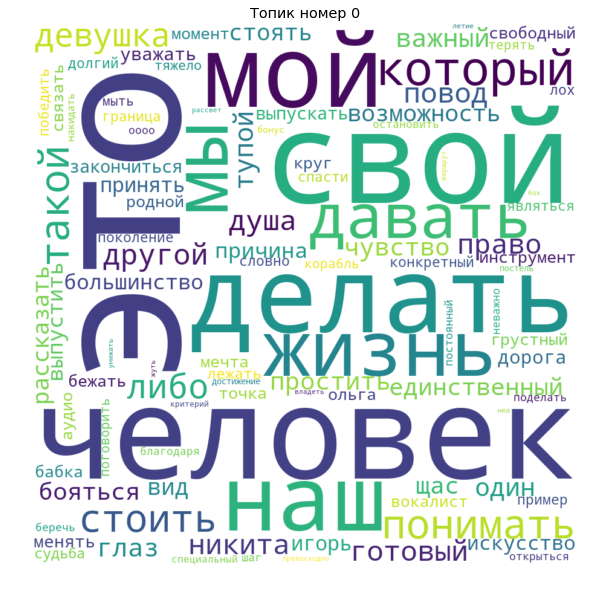

In [57]:
plt.figure(figsize=(15, 10))
plt.title("Топик номер {}".format(0))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off");

In [159]:
def getTopicWords(topic_number, scaling=10000):
    """
        Возвращает склеенные в текст слова топика, отмасштабированные по вероятности
    """
    # забираем слова и вероятности из топиков
    topic = lda_30_topics[topic_number][1]
    # инициализируем пустой лист для хранения текста
    topic_multiplied = []
    # проходимся по всем словам топика
    for word, prob in topic:
        # повторяем слово N раз, где N = int(word_probability * scaling)
        topic_multiplied.append([word] * int(prob*scaling))
    
    # склеиваем все слова в один текст
    topic_multiplied = sum(topic_multiplied, [])
    topic_multiplied = ",".join(topic_multiplied)
    
    return topic_multiplied

In [24]:
def plotWordCloud(topic_number):
    """
        Строит визуализацию слов на основе текстов топиков
    """
    # получаем частоты и слова топика
    
    text = dict(lda_20_topics[topic_number][1])
    
    # строим облако слов
    wordcloud = WordCloud(background_color="white", max_words=100, width=900, height=900, collocations=False)
    wordcloud = wordcloud.generate_from_frequencies(text)
    plt.figure(figsize=(15, 10))
    plt.title("Топик номер {}".format(topic_number))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off");

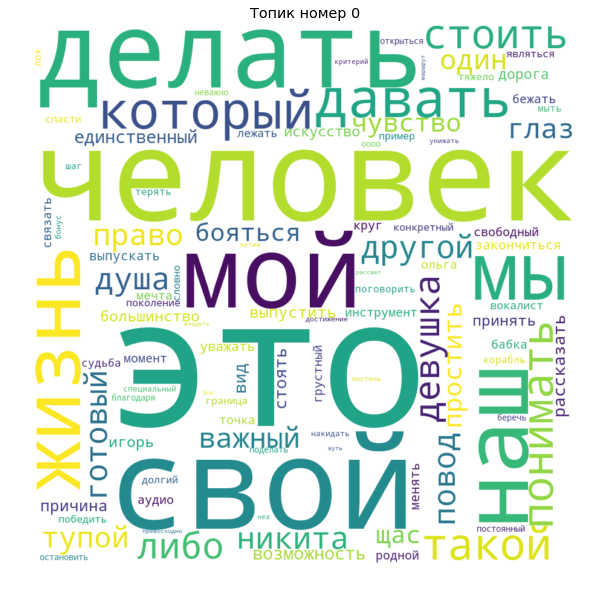

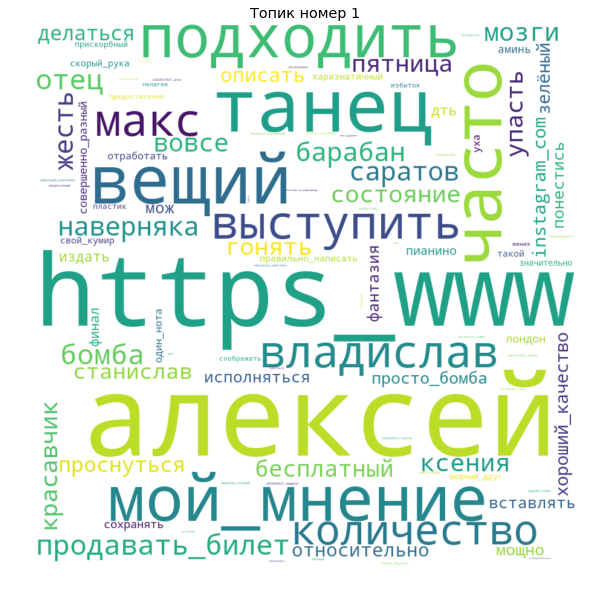

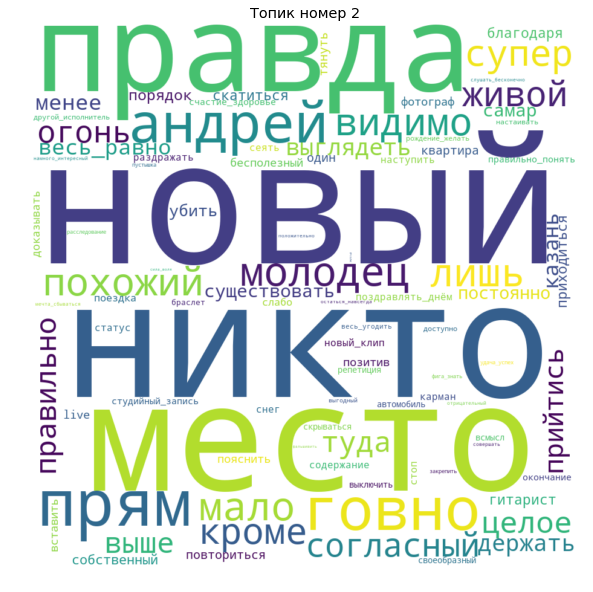

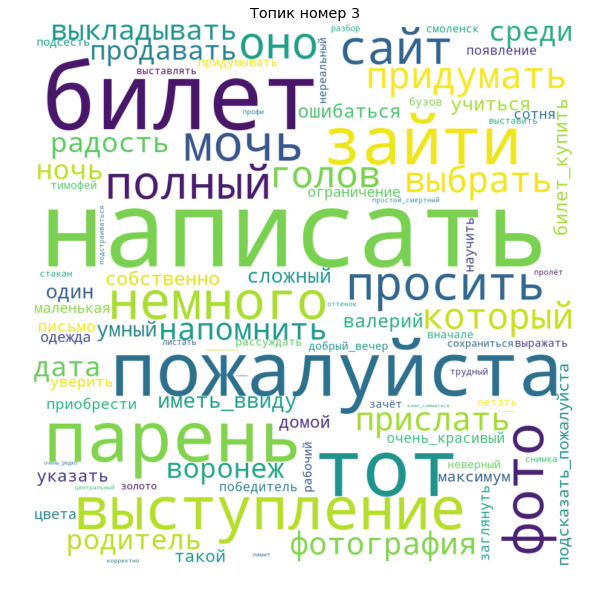

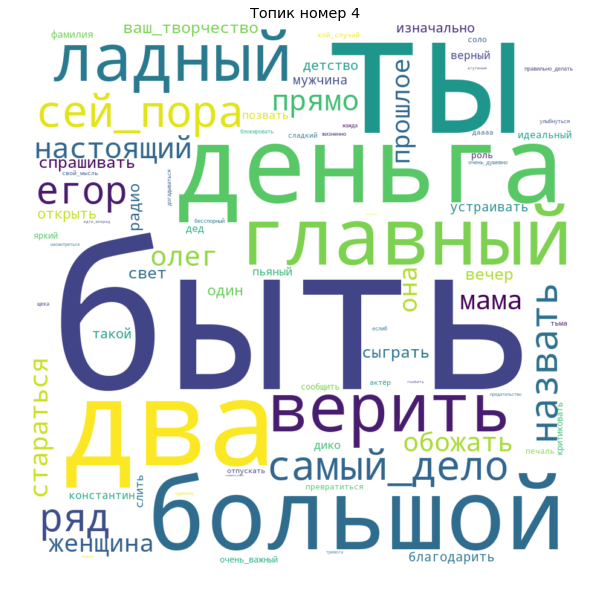

In [58]:
for i in range(5):
    plotWordCloud(topic_number=i)

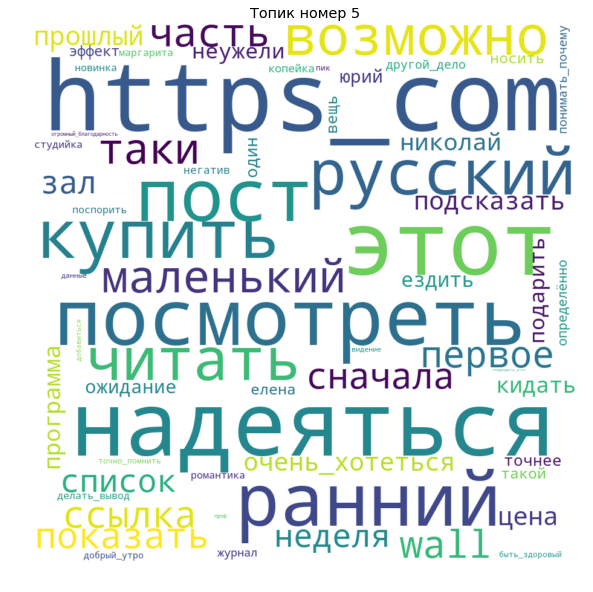

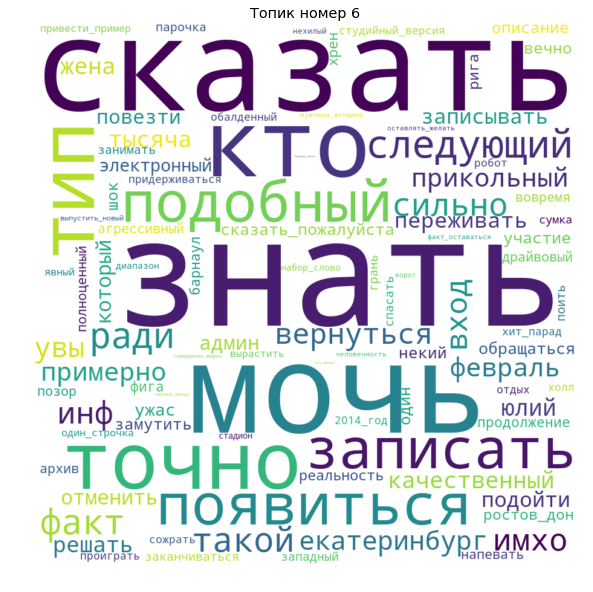

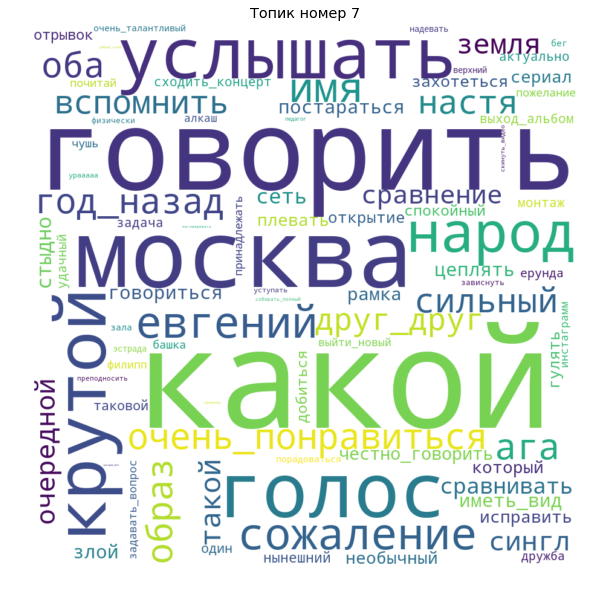

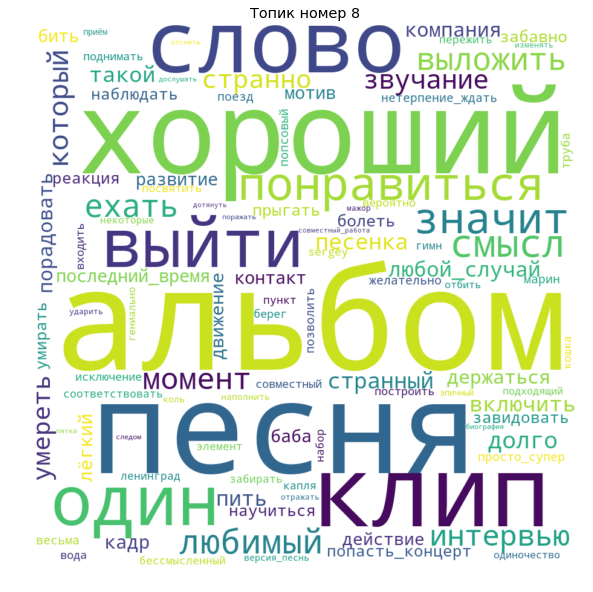

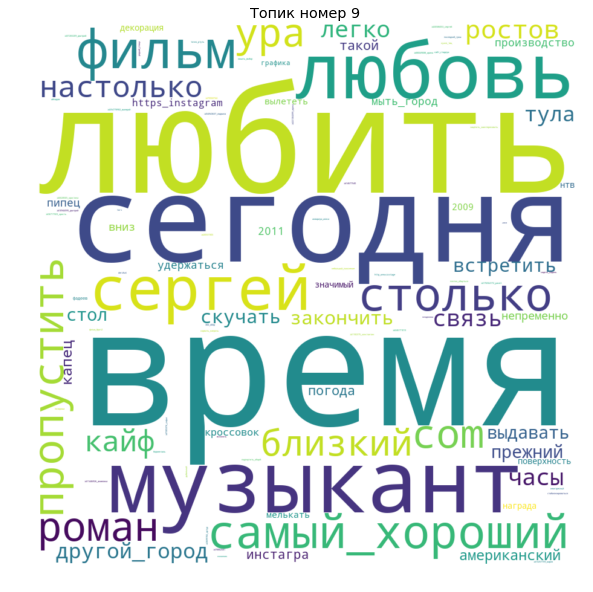

In [59]:
for i in range(5, 10):
    plotWordCloud(topic_number=i)

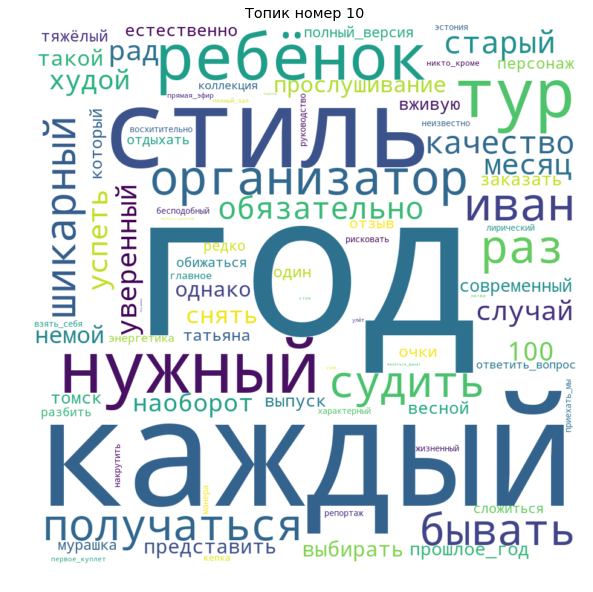

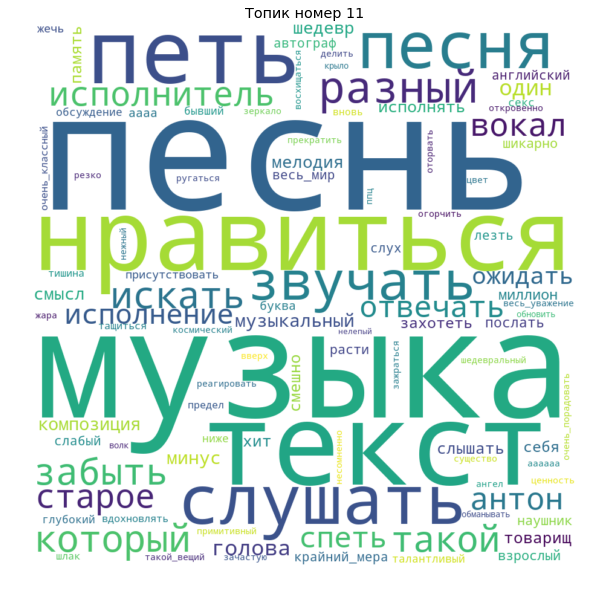

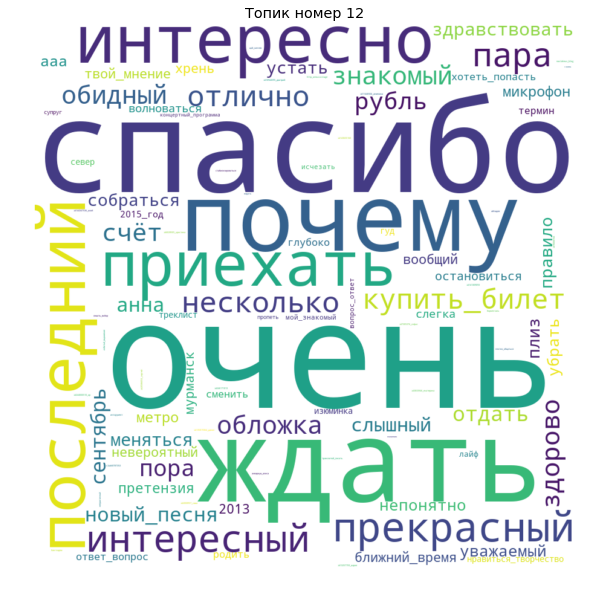

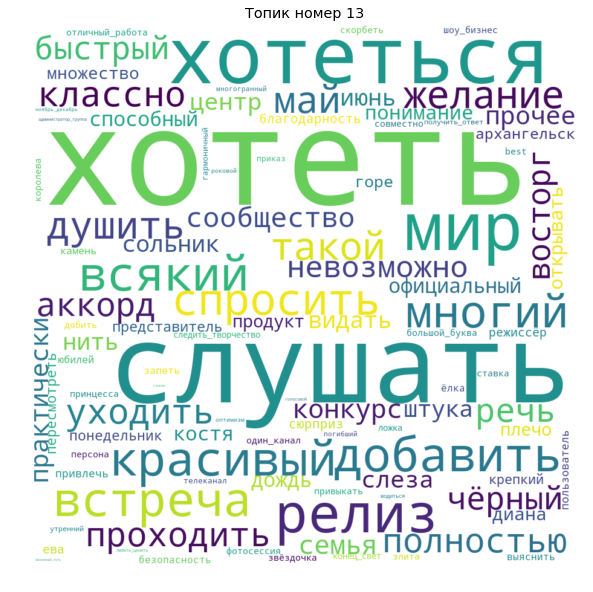

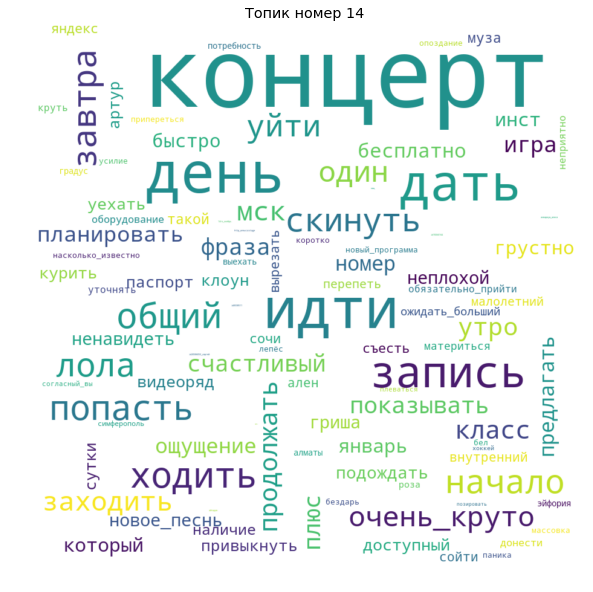

In [60]:
for i in range(10, 15):
    plotWordCloud(topic_number=i)

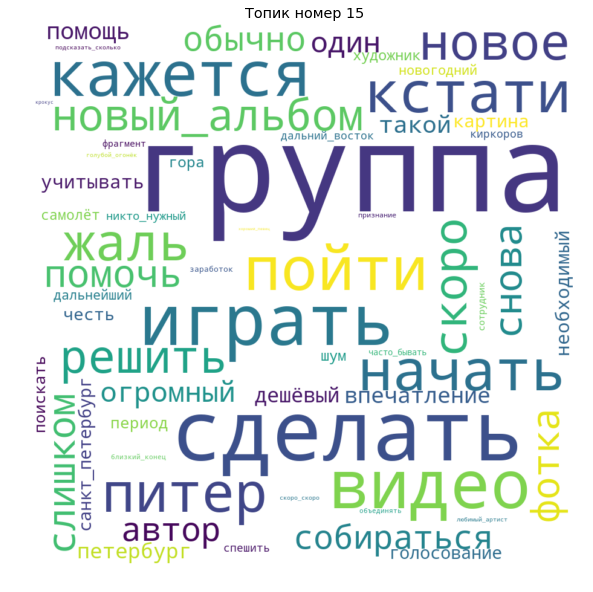

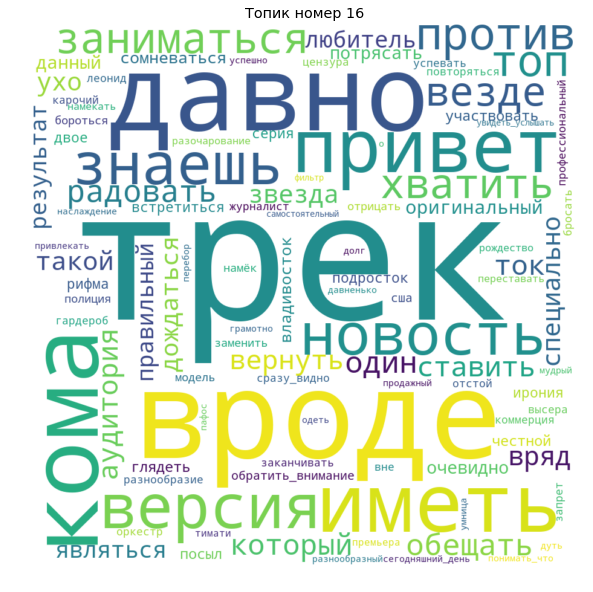

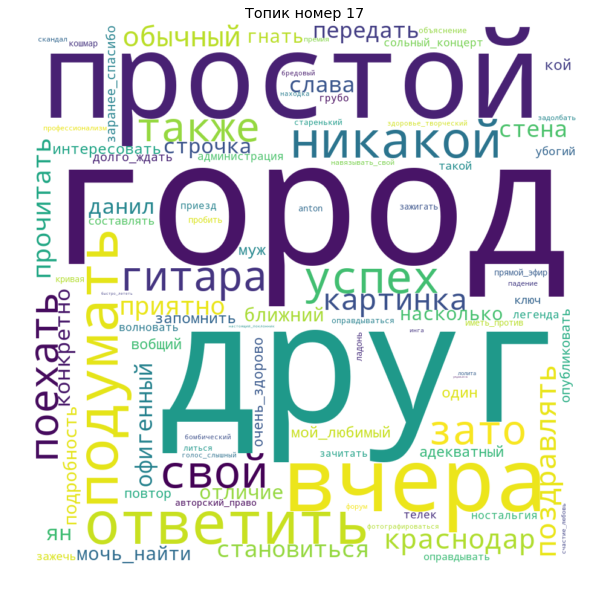

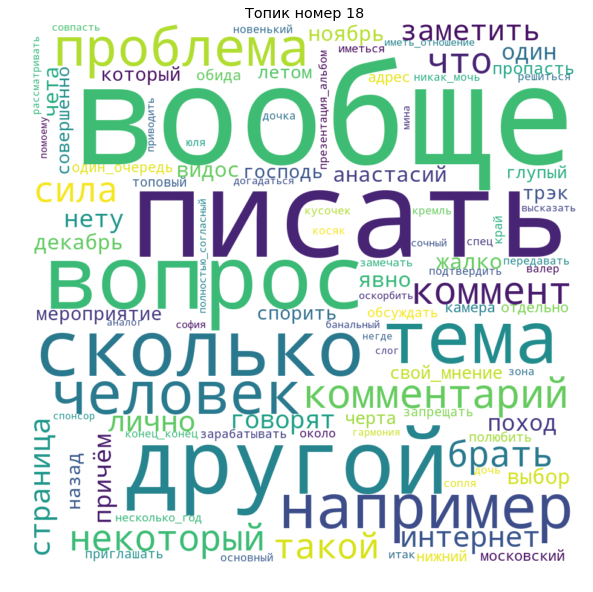

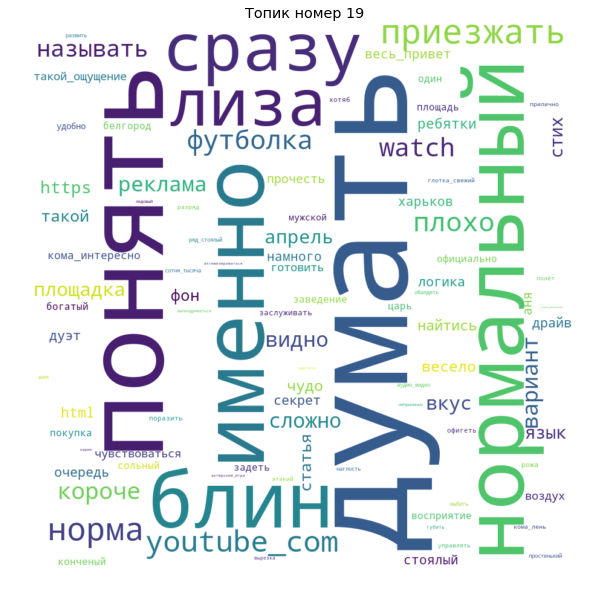

In [61]:
for i in range(15, 20):
    plotWordCloud(topic_number=i)

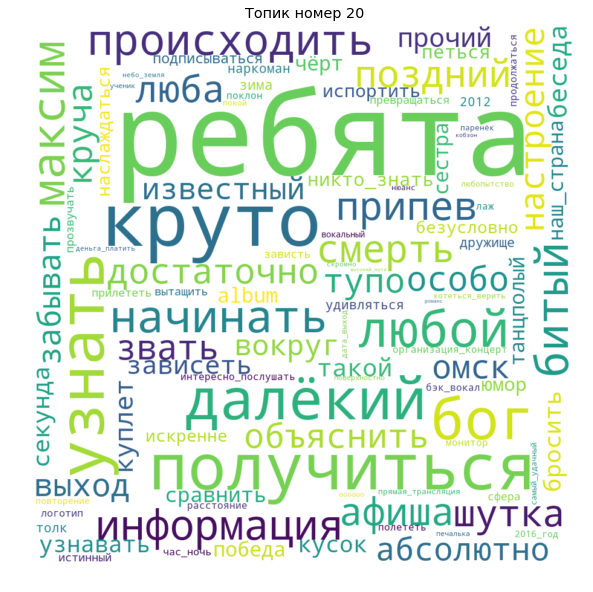

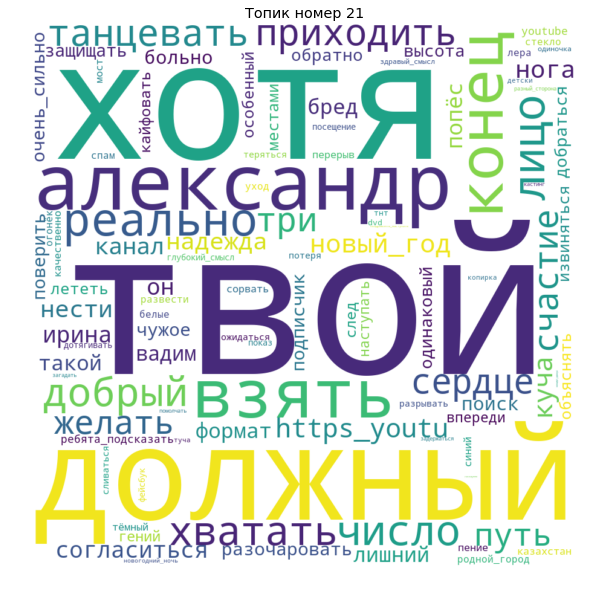

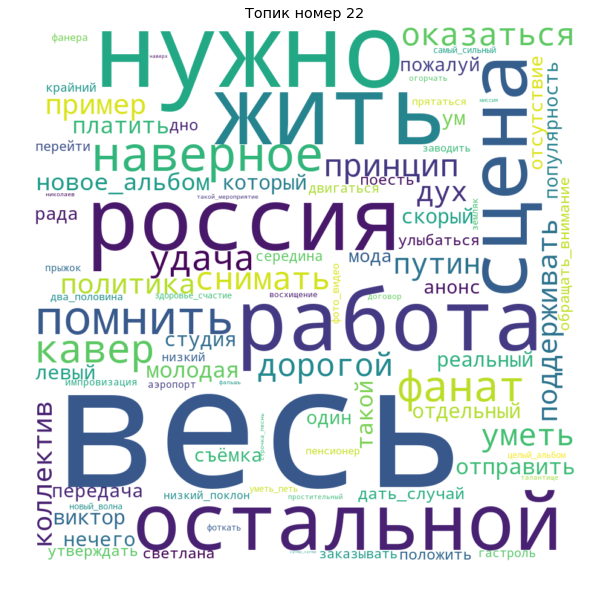

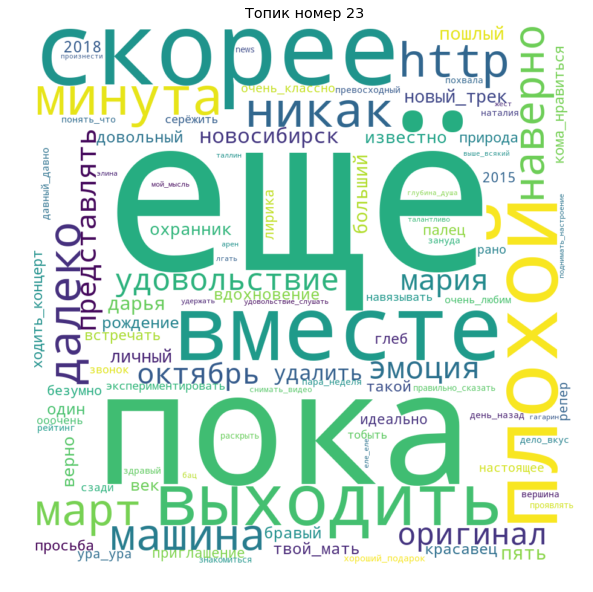

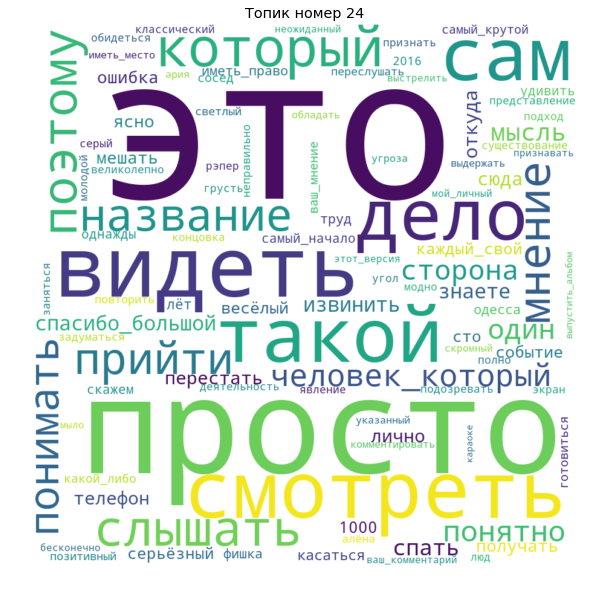

In [62]:
for i in range(20, 25):
    plotWordCloud(topic_number=i)

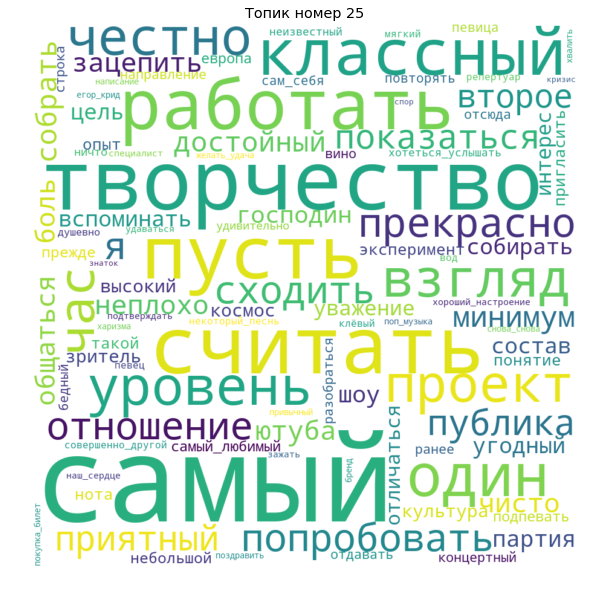

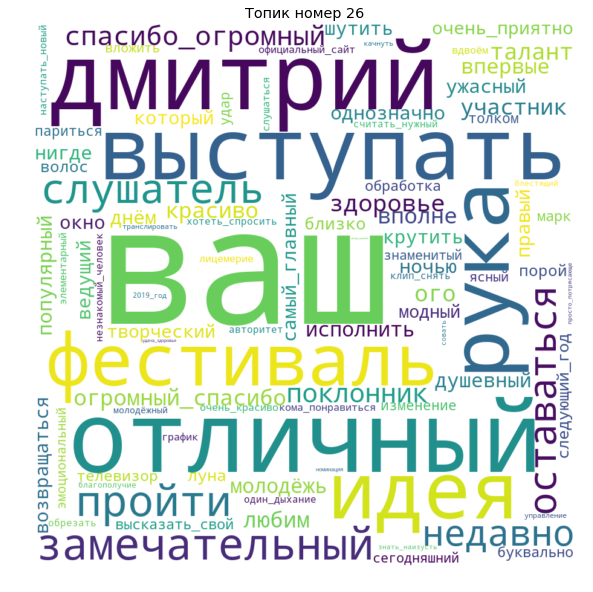

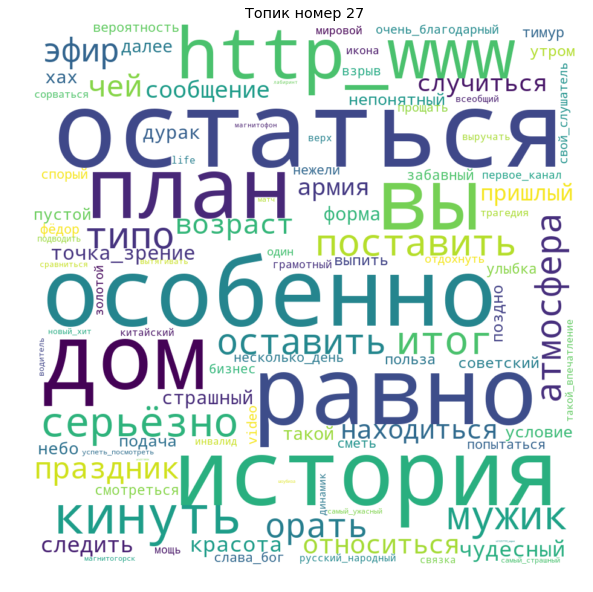

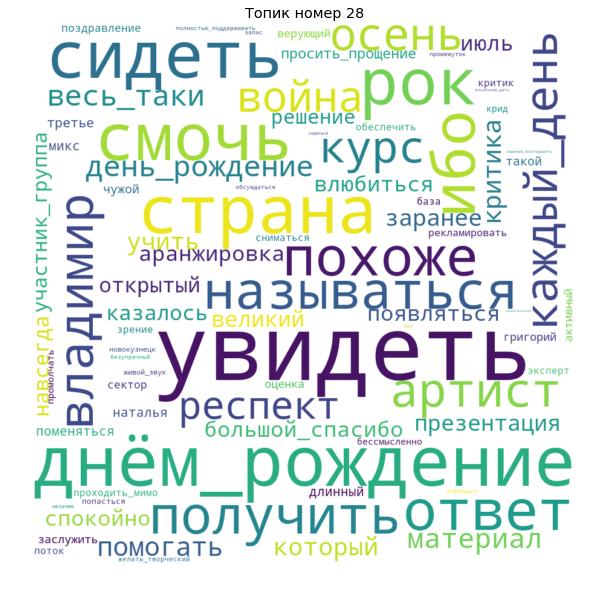

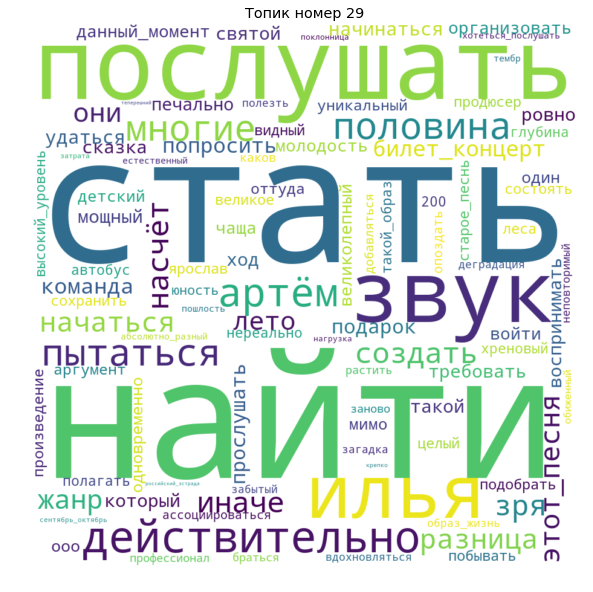

In [63]:
for i in range(25, 30):
    plotWordCloud(topic_number=i)

А теперь, зная общие распределения тем и содержания слов в них, построим распределения слов для "средних" подписчиков кандидатов

In [79]:
with open('candidate_themes', 'rb') as f:
    candidate_themes = pickle.load(f)

In [134]:
def getCandidateTopicText(candidate_name):
    """
        Возвращает склеенные в текст слова кандидата, отмасштабированные по вероятности топиков
    """
    candidate_text = ""
    # итерируем по всем топика
    for topic_number in range(30):
        # выкидываем самые большие топики
        if topic_number not in [21, 28]:
            # берем вероятность топика для кандидата
            topic_probability = candidate_themes[candidate_name][topic_number][1]
            # и ткущий топик
            topic = lda_30_topics[topic_number][1]
            # здесь будут храниться слова топика, взвешенные по вероятности топика
            weighted_topic = []
            # взвешиваем по вероятности слова и вероятности топика
            for word, probability in topic:
                weighted_topic.append([word] * int(prob*topic_probability*1000000))
            # склеиваем слова в один массив текста
            weighted_topic = sum(weighted_topic, [])
            candidate_text += ",".join(weighted_topic)
        
    return candidate_text

In [144]:
def plotCandidateWordCloud(candidate_name):
    """
        Строит визуализацию слов на основе текстов кандидатов
    """
    # получаем текст для кандидата
    candidate_text = getCandidateTopicText(candidate_name)
    # строим облако слов
    wordcloud = WordCloud(background_color="white", max_words=100,
                          width=900, height=900, collocations=False)
    wordcloud = wordcloud.generate(candidate_text)
    plt.figure(figsize=(15, 10))
    plt.title("Candidate {}".format(candidate_name))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off");

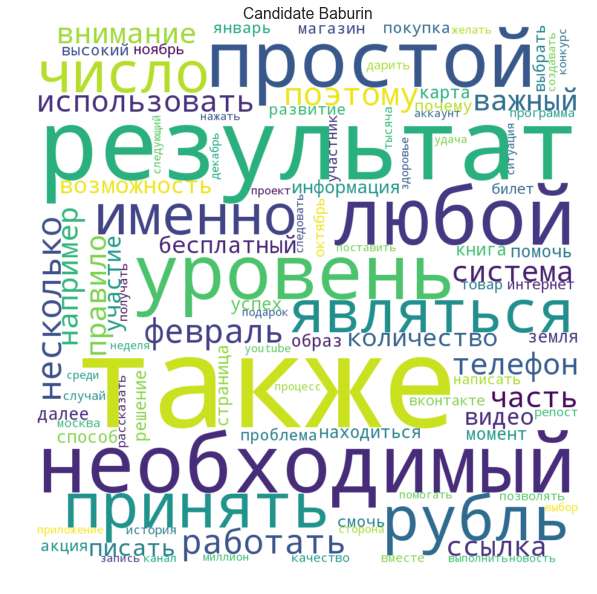

In [139]:
plotCandidateWordCloud('Baburin')

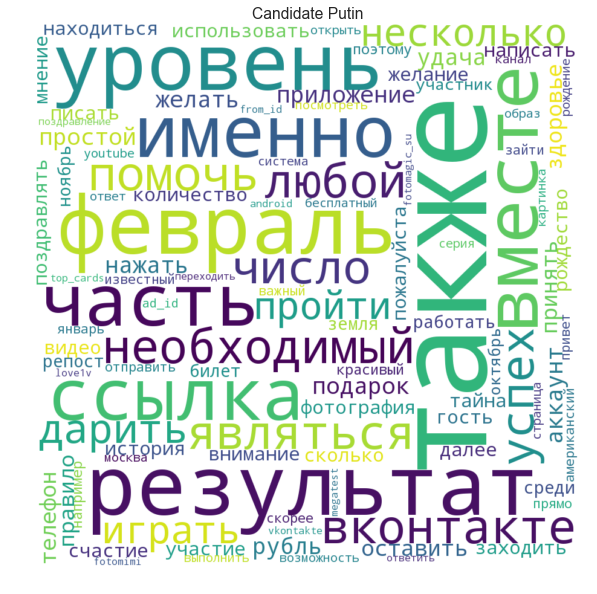

In [146]:
plotCandidateWordCloud('Putin')

In [140]:
from PIL import Image

In [160]:
full_text = ""
for topic_number in range(30):
    full_text += getTopicWords(topic_number, scaling=20000)

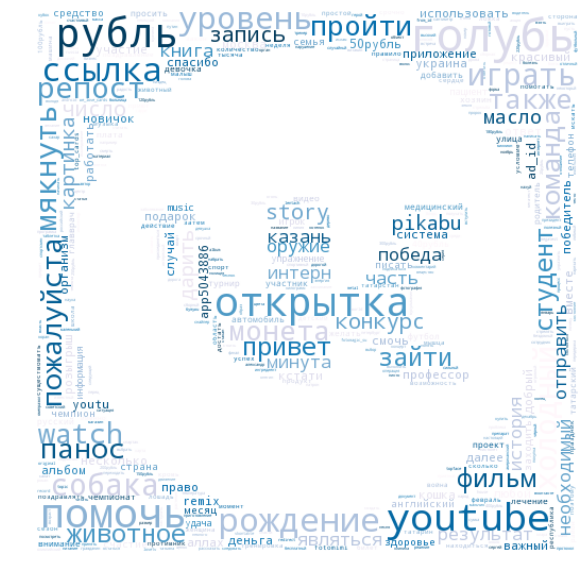

In [168]:
pic = np.array(Image.open("vkontakte_PNG19.png"))

# строим облако слов
wordcloud = WordCloud(background_color="white", max_words=20000, 
                      mask=pic, colormap='PuBu',
                      collocations=False)
wordcloud = wordcloud.generate(full_text)
plt.figure(figsize=(15, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off");

# Sentiment viz

In [2]:
import json
import pickle

In [3]:
path = '/Users/dmitrys/Yandex.Disk.localized/top_russian_music/comments/vk/'
print("Reading data")

with open(path + "vk_full_sentiments_1", 'rb') as f:
    comments = pickle.load(f)
with open(path + "vk_full_sentiments_2", 'rb') as f:
    comments.extend(pickle.load(f))
    
data = pd.DataFrame(comments)
del comments
print("Data shape:",data.shape)

Reading data
Data shape: (9297743, 15)


In [4]:
data.head()

,audio,author,comment_id,date,dirty_text,emoji,likes,link,music_style,performer,rusentiment_model,stickers,text,twitter_mokron_model,video
0,None,134973383,52228413_282387_282388,2018-12-31 21:40:35,"Шикарный подарок , песня замечательная !!!! Сп...",None,21,None,estrada,лепс,[speech],None,шикарный подарок песня замечательный спасибооо...,[Negative],None
1,None,197130573,52228413_282387_282390,2018-12-31 21:53:36,Самый лучший подарок - закончить год под песни...,None,15,None,estrada,лепс,[positive],None,самый хороший подарок закончить год песнь григ...,[Negative],None
2,None,34154783,52228413_282387_282399,2018-12-31 22:40:49,"Песни хит. Уверен, что получит много наград в ...",None,12,None,estrada,лепс,[neutral],None,песнь хит уверенный получить награда наступить...,[Positive],None
3,None,288989050,52228413_282387_282411,2018-12-31 23:53:59,С новым годом вас с новым счастьем вас. Пусть ...,None,0,None,estrada,лепс,[speech],None,новый год новый счастие пусть ваш самый заветн...,[Negative],None
4,None,137435081,52228413_282387_282420,2019-01-01 00:44:39,,None,0,None,estrada,лепс,[neutral],sticker_10297,,[Negative],None


# Идея - сентименты по жанрам, по исполнителям

In [5]:
data_sentiment = data[['music_style', 'performer', 'rusentiment_model', 'twitter_mokron_model']]

In [24]:
data_sentiment['rusentiment_model'] = data_sentiment['rusentiment_model'].apply(lambda x: x[0])
data_sentiment['twitter_mokron_model'] = data_sentiment['twitter_mokron_model'].apply(lambda x: x[0])

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [16]:
data_sentiment['count'] = 1

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [25]:
data_sentiment.head()

,music_style,performer,rusentiment_model,twitter_mokron_model,count
0,estrada,лепс,speech,Negative,1
1,estrada,лепс,positive,Negative,1
2,estrada,лепс,neutral,Positive,1
3,estrada,лепс,speech,Negative,1
4,estrada,лепс,neutral,Negative,1


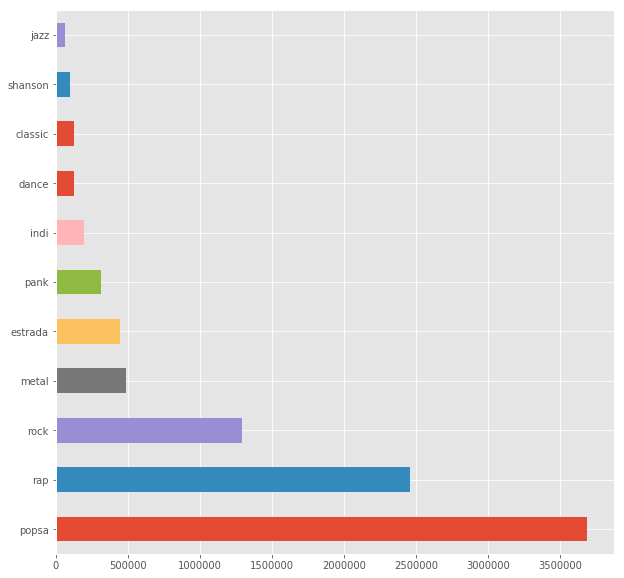

In [10]:
plt.figure(figsize=(10, 10))
data_sentiment.music_style.value_counts().plot.barh()
plt.show()

In [34]:
sentiment_style_grouped = data_sentiment.groupby("music_style").rusentiment_model.value_counts(normalize=True)
sentiment_style_grouped = sentiment_style_grouped.reset_index(name='percentage')
sentiment_style_grouped = sentiment_style_grouped.set_index('music_style')

In [49]:
sentiment_style_grouped.head()

,rusentiment_model,percentage
music_style,,
classic,neutral,0.718050
classic,positive,0.154481
classic,negative,0.063082
classic,speech,0.041314
classic,skip,0.023073


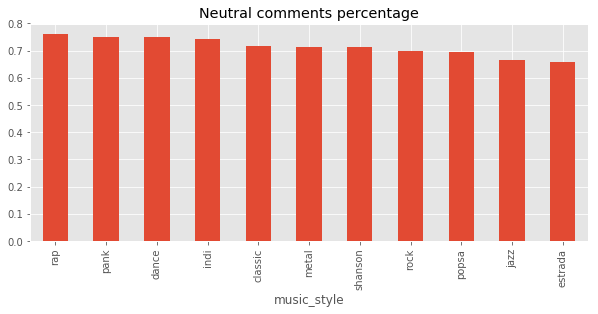

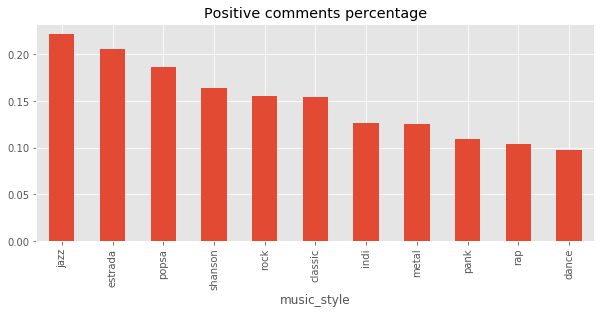

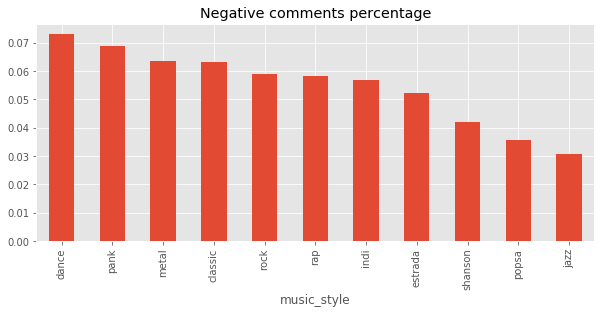

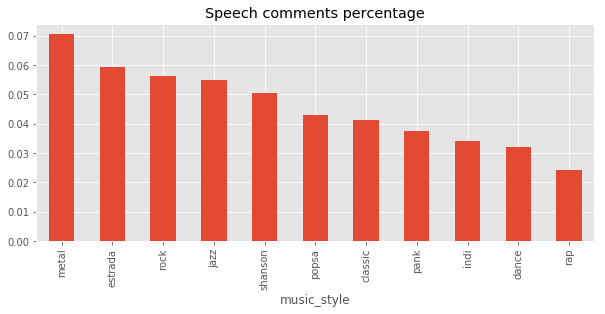

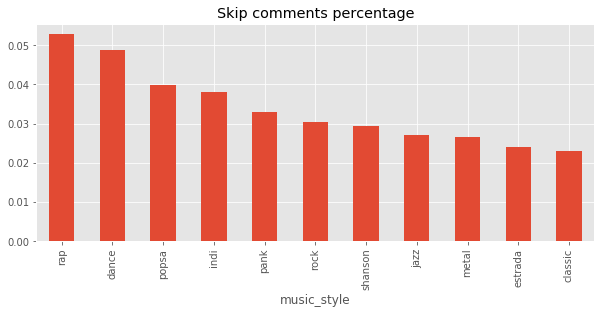

In [72]:
for sentiment in sentiment_style_grouped.rusentiment_model.unique():
    sentiment_style_grouped[
        sentiment_style_grouped.rusentiment_model==sentiment
    ].sort_values(
        by='percentage', ascending=False
    ).plot.bar(
        figsize=(10, 4), 
        legend=None,
        title='{} comments percentage'.format(sentiment).capitalize()
    );

In [73]:
sentiment_style_grouped = data_sentiment.groupby("music_style").twitter_mokron_model.value_counts(normalize=True)
sentiment_style_grouped = sentiment_style_grouped.reset_index(name='percentage')
sentiment_style_grouped = sentiment_style_grouped.set_index('music_style')
sentiment_style_grouped.head()

,twitter_mokron_model,percentage
music_style,,
classic,Negative,0.764094
classic,Positive,0.235906
dance,Negative,0.801878
dance,Positive,0.198122
estrada,Negative,0.703535


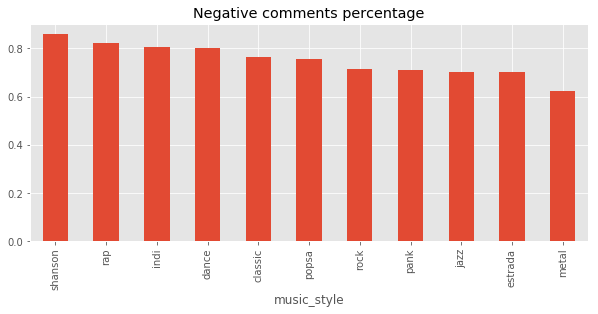

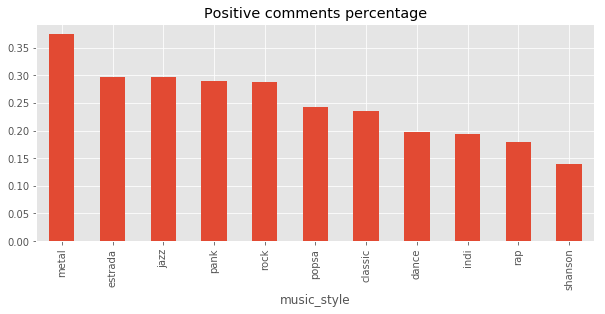

In [75]:
for sentiment in sentiment_style_grouped.twitter_mokron_model.unique():
    sentiment_style_grouped[
        sentiment_style_grouped.twitter_mokron_model==sentiment
    ].sort_values(
        by='percentage', ascending=False
    ).plot.bar(
        figsize=(10, 4), 
        legend=None,
        title='{} comments percentage'.format(sentiment).capitalize()
    );